# Understanding Trends in Property Market Value in Washington 


## Business Understanding

The real estate agency aims to provide comprehensive services to homeowners looking to buy or sell their properties. One significant aspect of their services involves advising homeowners on potential renovations that could increase the estimated value of their homes. This guidance is crucial in assisting homeowners in making informed decisions about investing in renovations that will yield a favorable return on investment (ROI) when they decide to sell their property.

#### Stakeholder:
Real Estate Agency
  
### Problem Statement:
The real estate agency lacks an efficient  method and face challenges in understanding the factors influencing the potential increase in the estimated value of a property. Without this capability, homeowners may not receive optimal advice regarding which renovations to pursue and what factors to consider when buying a property, leading to potential dissatisfaction or loss of value. Therefore, there is a pressing need to develop a data-driven solution that can accurately predict the impact of various renovations/House Features on the estimated value of houses, enabling the agency to provide tailored and informed recommendations to homeowners in King City County.

### Objectives:
Analyze the relationship between property attributes such as lot area, no of bedrooms, the grade, condition , etc. and their impact on house prices.
Which factors are the most influential and the least on house prices.


Evaluate Model Performance:
Utilize metrics such as mean squared error, R-squared values, and residual analysis to assess the model's effectiveness in accurately predicting house prices.

Offer Reccomendations:
Reccomend insights to the Real Estate Agency that will help them understand how the property attributes impact the value of a property

### Research Questions

1.  What is the combined influence of structural features, location, and temporal factors on the market price of houses, and how can we optimally model these relationships to predict housing prices with high accuracy?
2. Is there a statistically significant difference in lot size (sqft_lot) among houses with varying grades?
3. Do houses with a waterfront view have a significantly higher average price compared to houses without a view?
4. To what extent does the combined influence of bedrooms and bathrooms affect the price of a house?

#### Hypothesis
#### What is the combined influence of structural features, location, and temporal factors on the market price of houses, and how can we optimally model these relationships to predict housing prices with high accuracy?
    H0: None of the structural features, location specifics, and temporal factors significantly predict the market price of houses.

    H1: At least one of the structural features, location specifics, or temporal factors significantly predicts the market price of houses.
#### Is there a statistically significant difference in lot size (sqft_lot) among houses with varying grades?
    Ho: There is no significant relationship between the condition of a house and its grade.

    H1:There is a significant relationship between the condition of a house and its grade.

#### Do houses with a waterfront view have a significantly higher average price compared to houses without a view?
    Ho: Houses with waterfront view do not have significantly higher prices when compared oto houses without front view.

    H1: Houses with waterfront view have significantly higher prices when compared oto houses without front view.

#### To what extent does the combined influence of bedrooms and bathrooms affect the price of a house?
    H0: There is no statistically significant interaction effect between the number of bedrooms and the number of bathrooms on the price of a house. 

    H1: There is a statistically significant interaction effect between the number of bedrooms and the number of bathrooms on the house price. 

## Data Understanding 
The dataset comprises 21,597 entries across 21 columns, reflecting various aspects of housing data. Most columns show a non-null count, indicating a relatively complete dataset. However, there are some key points to note regarding potential missing values.
### Column Names and Descriptions for King County Data Set
*Property Attributes
* `id` - Unique identifier for a house
* `date` - Date house was sold
* `price` - Sale price (target variable)
* `bedrooms` - Number of bedrooms
* `bathrooms` - Number of bathrooms
* `sqft_living` - Square footage of living space in the home
* `sqft_lot` - Square footage of the lot
* `floors` - Number of floors (levels) in house
* `waterfront` - Whether the house is on a waterfront eg a lake
* `view` - Quality of view from house
* `condition` - How good the overall condition of the house is. Related to maintenance of house.
  explanation of each condition code
* `grade` - Overall grade of the house. Related to the construction and design of the house.
  explanation of each building grade code
* `sqft_above` - Square footage of house apart from basement
* `sqft_basement` - Square footage of the basement
* `yr_built` - Year when house was built
* `yr_renovated` - Year when house was renovated
* `zipcode` - ZIP Code used by the United States Postal Service
* `lat` - Latitude coordinate
* `long` - Longitude coordinate
* `sqft_living15` - The square footage of interior housing living space for the nearest 15 neighbors
* `sqft_lot15` - The square footage of the land lots of the nearest 15 neighbors



### Data Source and it’s suitability  for the project
The data source utilized for our analysis was obtained from GitHub, specifically from the House Price Dataset uploaded by Learn-Co-Curriculum in 2021. This dataset includes variables such as date, view, square footage of above-ground living space, square footage of basements, year of renovation, zipcode, latitude, longitude, square footage of living areas, and square footage of lots. These variables are crucial for addressing our research questions.

Reference
Learn-Co-Curriculum. (2021). House Price Dataset. GitHub. https://github.com/learn-co-curriculum/dsc-phase-2-project-v2-3

### LImitation
Nonetheless, it is important to acknowledge that this dataset, being from 2021, may not fully reflect the current market conditions. Market dynamics could have shifted in the intervening period, potentially impacting the relevance of our analysis. Additionally, as this is secondary data, there may be limitations regarding its accuracy and applicability to our current study.




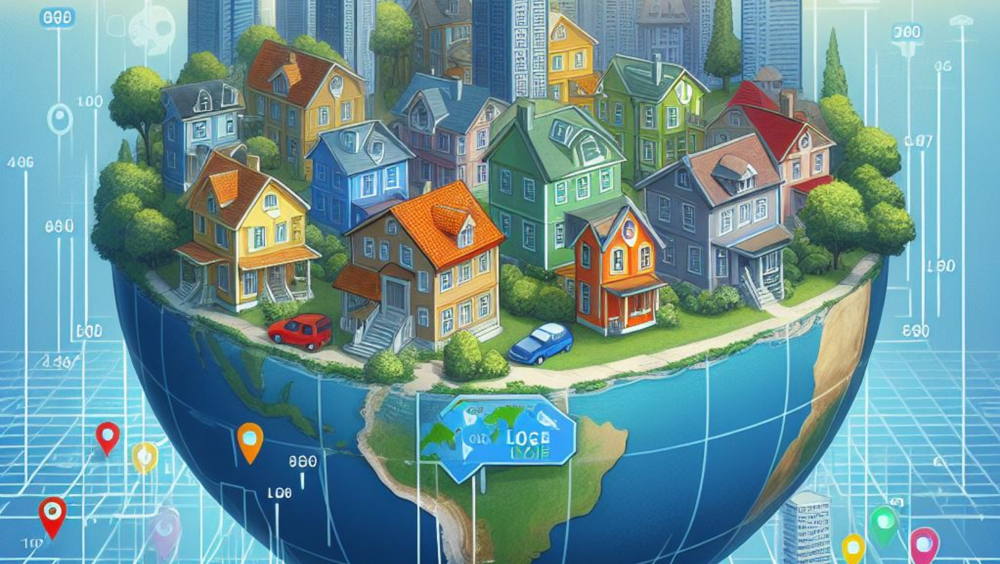

## Data Preparation

**Importing libraries**

Before we embark on our journey through the housing market analysis, it's essential to equip ourselves with a comprehensive set of data science tools. Our toolkit includes numpy and pandas for advanced data handling, matplotlib and seaborn for engaging visualization, statsmodels for detailed statistical modeling, and a collection of sklearn features for data preprocessing, creation, machine learning implementation, and performance evaluation. We also incorporate gauss for random number generation, and scipy.stats for a wider spectrum of statistical analyses. This arsenal ensures we're fully prepared to delve deep into the data, offering insightful perspectives on the intricacies of house prices in Kenya.

In [1]:
# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from pandas.plotting import scatter_matrix


# Statistical modeling
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.weightstats import ztest

# Machine Learning preprocessing and modeling
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures, MinMaxScaler

# Statistical functions
import scipy.stats as sp
from scipy.stats import skew, kurtosis, chi2_contingency
#import scipy.stats as sp


# 3D plotting
from mpl_toolkits.mplot3d import Axes3D

# Helper functions
from random import gauss

# Configuration
warnings.filterwarnings('ignore')  # To ignore all warnings in your script
%matplotlib inline

**Importing the dataset **

To kick off our analysis of housing market, we start by importing the dataset with detailed house listings from kc_house_data.csv using pandas, a powerful tool for data manipulation.

We create a copy of this dataset to preserve the original data, allowing us to explore and manipulate the data without altering the source.

Next, we preview the dataset to familiarize ourselves with its structure. Viewing the last entries with data.head() gives us insight into the top 5 columns.



In [2]:
# Read the CSV file into a Pandas DataFrame
data = pd.read_csv("data/kc_house_data.csv")

# Create a copy of the DataFrame for safety
data_copy = data.copy()

# To view the first 5 rows and 10 columns of the data
data.iloc[:, 0:11].head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,Average
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,Average
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,Average
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,Very Good
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,Average


In [3]:
# To view the first 5 rows and last 11 columns of the data
data.iloc[:, 11:25].head()

,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [4]:
#To view the labels for each column in the DataFrame
data.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

# Summary of descriptive analysis
Within the dataset, the properties showcase a mean living area size of approximately 2080 square feet, indicating moderately spacious homes, with lot sizes averaging around 15,099 square feet, hinting at generous outdoor spaces. The data reflects a variety of homes, with the majority having 1 to 2 floors, and a smaller fraction boasting waterfront views, a coveted feature that suggests premium valuation. The average grade given to properties, which assesses design and construction quality, hovers around 7.65, pointing towards good quality builds across the dataset. The year of construction spans from the early 1900s to contemporary builds, reflecting a historical depth and evolution in housing styles and structures.

In [5]:
# Generate descriptive statistics that summarize the central tendency,
# dispersion, and shape of the dataset's distribution, excluding NaN values
# Displaying descriptive statistics for the first 11 columns of the DataFrame
data.iloc[:, 0:10].describe().round(3)


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors
count,2.159700e+04,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000
mean,4.580474e+09,540296.574,3.373,2.116,2080.322,15099.409,1.494
std,2.876736e+09,367368.140,0.926,0.769,918.106,41412.637,0.540
min,1.000102e+06,78000.000,1.000,0.500,370.000,520.000,1.000
25%,2.123049e+09,322000.000,3.000,1.750,1430.000,5040.000,1.000
50%,3.904930e+09,450000.000,3.000,2.250,1910.000,7618.000,1.500
75%,7.308900e+09,645000.000,4.000,2.500,2550.000,10685.000,2.000
max,9.900000e+09,7700000.000,33.000,8.000,13540.000,1651359.000,3.500


In [6]:
# Displaying descriptive statistics for the first last 11 columns of the DataFrame

data.iloc[:, 10:25].describe().round(3)


,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21597.000,21597.000,17755.000,21597.000,21597.000,21597.000,21597.00,21597.000
mean,1788.597,1971.000,83.637,98077.952,47.560,-122.214,1986.62,12758.284
std,827.760,29.375,399.946,53.513,0.139,0.141,685.23,27274.442
min,370.000,1900.000,0.000,98001.000,47.156,-122.519,399.00,651.000
25%,1190.000,1951.000,0.000,98033.000,47.471,-122.328,1490.00,5100.000
50%,1560.000,1975.000,0.000,98065.000,47.572,-122.231,1840.00,7620.000
75%,2210.000,1997.000,0.000,98118.000,47.678,-122.125,2360.00,10083.000
max,9410.000,2015.000,2015.000,98199.000,47.778,-121.315,6210.00,871200.000


## Data Information 

The dataset comprises 21,597 entries across 21 columns, reflecting various aspects of housing data. Most columns show a non-null count, indicating a relatively complete dataset. However, there are some key points to note regarding potential missing values and data types that may require transformation:

The waterfront column has 19,221 non-null entries, suggesting missing values that need to be addressed.
The view column shows 21,534 non-null entries, indicating a small number of missing values.
The yr_renovated column, with 17,755 non-null entries, also points to missing data that could influence analyses related to renovations.
The date column is an object type and might need to be converted to a  int format for any time-series analysis.
The sqft_basement column is listed as an object, indicating it may contain non-numeric values that need to be converted to integers for quantitative analysis.
Columns such as price, bathrooms, floors, and those indicating location (like lat and long) are in float64 format. They will be converted to integers or keep them as floats for precision.

In [7]:
# To show information about the DataFrame, including data types and missing values

data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [8]:
#Checking  the values are grouped in the discrete data columns


# Count items for the 'sqft_basement' column
sqft_basement_counts = data['sqft_basement'].value_counts()

view = data['view'].value_counts()


# Display the counts
# print("View Counts:\n", view_counts)
print("\nSqft Basement Counts:\n", sqft_basement_counts)
print("view:\n", view)


Sqft Basement Counts:
 0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
1990.0        1
516.0         1
508.0         1
861.0         1
2390.0        1
Name: sqft_basement, Length: 304, dtype: int64
view:
 NONE         19422
AVERAGE        957
GOOD           508
FAIR           330
EXCELLENT      317
Name: view, dtype: int64


## Data Wrangling- changing data types and addressing missing values

While most numerical features seem appropriate, some columns could benefit from tweaks. For example, "bathrooms" and "floors" are currently stored as floating-point numbers, even though they likely represent whole numbers of bathrooms or floors. To ensure consistency and potentially improve future analysis, we'll convert these columns to integers using .astype(int). Additionally, the "yr_built" column currently holds the year as integers. Finally, the "sqft_basement" column, although containing numerical data, is currently stored as text. We'll convert it to a float using .astype(float) for better compatibility with other numerical features in our analysis.

In [9]:
# Convert the 'bathrooms' column from float to integer, simplifying the data but losing fractional bathroom details.
data["bathrooms"]= data["bathrooms"].astype(int)
# Convert the 'floors' column from float to integer, discarding any fractional floor information.
data["floors"]= data["floors"].astype(int)


In [10]:
#Converting view from float to integer
# view_mapping = {'NONE': 0, 'AVERAGE': 1, 'FAIR': 2, 'GOOD': 3, 'EXCELLENT': 4}
data['view'] = data['view'].replace({'NONE': 0, 'AVERAGE': 1, 'FAIR': 2, 'GOOD': 3, 'EXCELLENT': 4})
data['view'] = data['view'].fillna(0).astype(int)


In [11]:
# Replace non-numeric values with NaN (if necessary) and convert to float

data['sqft_basement'] = data['sqft_basement'].replace('?', np.nan).astype(float)
# Replcaing the nullvalues with 0  since it is the mode, it implies that most houses do not have a basement
data['sqft_basement'] = data['sqft_basement'].fillna(0)
data['waterfront'] = data['waterfront'].replace({'NO': 0, 'YES': 1})
#Replacing the null values with the mode which is zero
data["waterfront"]=data["waterfront"].fillna(0)
#Converting waterfront variable from float to integer
data["waterfront"]= data["waterfront"].astype(int)

We addressed key data preparation steps for our analysis by first filling missing values in the waterfront column with 0, aligning with the observation that the mode value was 0, which implies most properties do not feature waterfront access.  Next, we converted the waterfront column to an integer data type using the .astype(int) method. This step was necessary because, after filling in the missing values with 0 to indicate properties without waterfront access, we needed to ensure the entire column had a consistent data type for analysis.

In [12]:
#Checking for the missing values in the data set
data.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront          0
view                0
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [13]:
# data.info()
data.grade.value_counts() 
# Convert 'grade' to float by extracting the number from the string
data['grade'] = data['grade'].str.extract('(\d+)').astype(int)

In [14]:
data.grade.value_counts() 

7     8974
8     6065
9     2615
6     2038
10    1134
11     399
5      242
12      89
4       27
13      13
3        1
Name: grade, dtype: int64

### Label Encoding
First, we create a LabelEncoder to help us convert the condition in our data into numerical values. These conditions  are "Poor", "Fair", "Average", "Good", and "Very Good". We want to assign numerical labels to these grades in a specific order for clarity, so we specify this order when creating the LabelEncoder. Then, we use this LabelEncoder to transform the "condition" column in our dataset. This process assigns a numerical value to each clarity grade based on the specified order. For example, "Poor" might be assigned 0, "Fair" might be assigned 1, and so on. This transformation helps us work with these clarity grades more easily in our analysis.

In [15]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()

# Create the LabelEncoder with the specified order for clarity grades
data["condition"] = labelencoder.fit_transform(data["condition"])
labelencoder = LabelEncoder().fit(["Poor", "Fair", "Average", "Good", "Very Good"])


In [16]:
# Add the results to the original housing dataframe 
data.condition.value_counts()  ## checking the values present in condioton column  

0    14020
2     5677
4     1701
1      170
3       29
Name: condition, dtype: int64

# Droping irrelevant columns
To ensure the data's relevance to our analysis, we performed some initial data cleaning. Two columns, id and yr_renovated, were removed. The id column, while unique, didn't contribute to the analysis since it only identifies data points. We also excluded the yr_renovated column due to the substantial number of missing values (3842). Replacing these missing years would have been challenging, and the column's overall impact on the analysis was minimal. With these refinements, our data is better prepared for further exploration.

In [17]:
data.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [18]:
# Dropping the 'yr_renovated' column from the DataFrame in place

data.drop(['yr_renovated', 'id'] , axis=1, inplace=True)

Confirming if all missing values were dropped

In [19]:
# Counting the number of missing values (NaN) in each column of the DataFrame
data.isna().sum()


date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

# Checking for outliers

 Each attribute captured in the plots, such as price, square footage, and number of bathrooms, is complete with data points. Additionally, the presence of outliers in various categories—those data points that fall outside the typical range—appears to be legitimate. In the context of housing data, such outliers could reflect high-value properties that naturally deviate from the norm due to their size, location, or luxury features. Acknowledging these outliers as genuine allows us to maintain the integrity of the dataset and ensures that our analysis considers the full spectrum of the housing market, including both standard and exceptional properties.

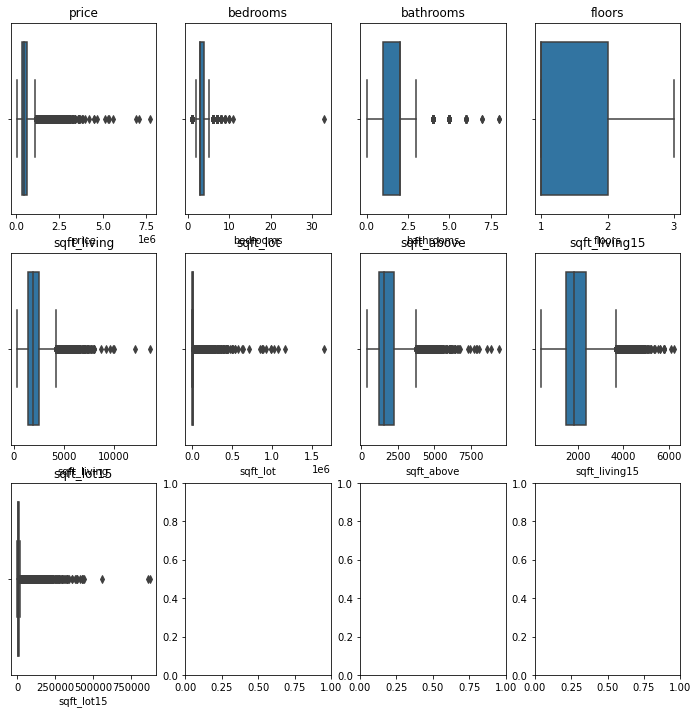

In [20]:
columns_to_plot = ['price', 'bedrooms', 'bathrooms', "floors",
                   "sqft_living", "sqft_lot","sqft_above", "sqft_living15", "sqft_lot15"]
rows, cols = 3, 4
fig, axes = plt.subplots(rows, cols, figsize=(12, 12))

for i, column in enumerate(columns_to_plot):
    row = i // cols
    col = i % cols
    sns.boxplot(data[column], ax=axes[row, col])
    axes[row, col].set_title(column)
    axes[row, col].set_xlabel(column)


In [21]:
data.bathrooms.value_counts()

2    10539
1     8353
3     2228
4      338
0       75
5       48
6       12
8        2
7        2
Name: bathrooms, dtype: int64

Dropping the max outlier for bedroom since it is only appears once and the value is extreme the house also has one bathroom which is not normal to have 33 bedrooms in one house and  a single bathroom.

In [22]:

data.drop(data[data.bedrooms==data.bedrooms.max()].index, axis = 0, inplace = True) # drops outlier for bedroom

# Checking Manually for the Presence of Outliers
We decided to assess the necessity of removing outliers. The longitude and latitude coordinates were accessible, enabling the group to manually verify if the coordinates matched the stated features of the houses. The images provided below show these houses, and the team concluded that they are not outliers.

In [23]:
# The code below was used to check if the houses with extreme number of bedrooms more than 6 actually exist.
properties_with_more_than_6_bathrooms = data[data['bathrooms'] > 6]

# Display the filtered DataFrame
properties_with_more_than_6_bathrooms
properties_with_more_than_6_bathrooms.iloc[:, 0:11]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade
7245,10/13/2014,7700000.0,6,8,12050,27600,2,0,3,2,13
8537,8/11/2014,450000.0,9,7,4050,6504,2,0,0,0,7
9245,9/19/2014,6890000.0,6,7,9890,31374,2,0,4,0,13
12764,5/5/2014,2280000.0,7,8,13540,307752,3,0,4,0,12


In [24]:
#To view the last 10 columns
properties_with_more_than_6_bathrooms.iloc[:, 11:25]


,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
7245,8570,3480.0,1910,98102,47.6298,-122.323,3940,8800
8537,4050,0.0,1996,98144,47.5923,-122.301,1448,3866
9245,8860,1030.0,2001,98039,47.6305,-122.240,4540,42730
12764,9410,4130.0,1999,98053,47.6675,-121.986,4850,217800


House 1: 7245 
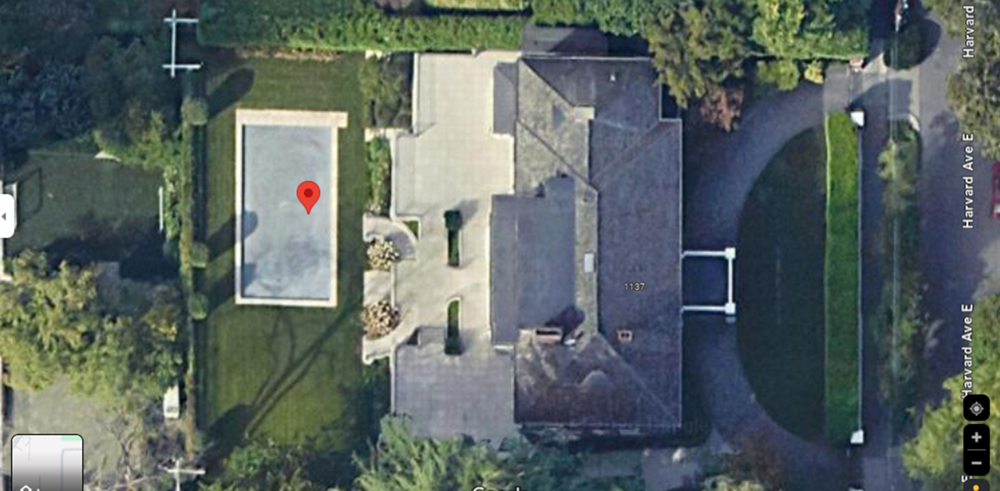
https://www.google.com/maps/place/47%C2%B037'47.3%22N+122%C2%B019'22.8%22W/@47.6298056,-122.323,542m/data=!3m2!1e3!4b1!4m4!3m3!8m2!3d47.6298056!4d-122.323?entry=ttu

House 2: 8537
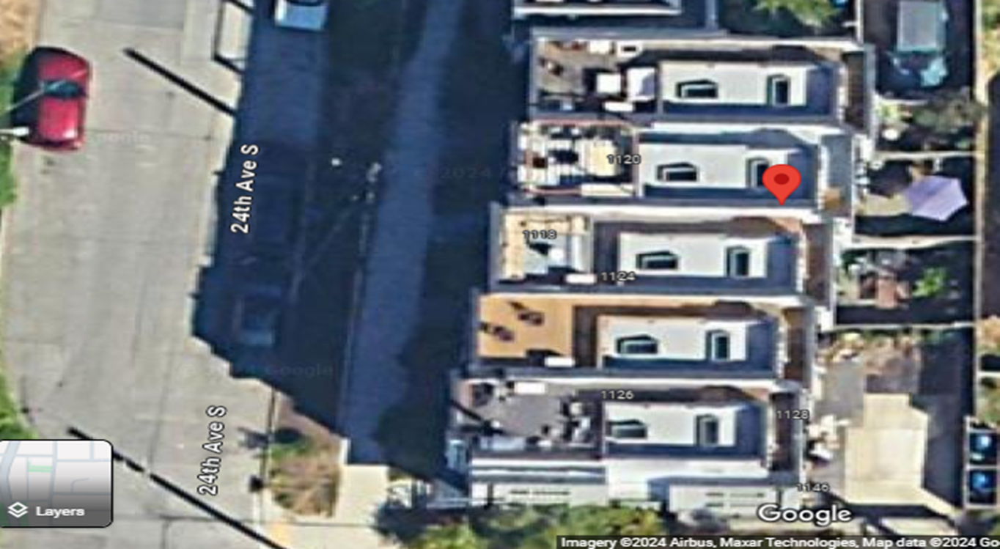
https://www.google.com/maps/place/47%C2%B035'32.3%22N+122%C2%B018'03.6%22W/@47.5923,-122.3035803,542m/data=!3m2!1e3!4b1!4m4!3m3!8m2!3d47.5923!4d-122.301?entry=ttu

House 3: 9245
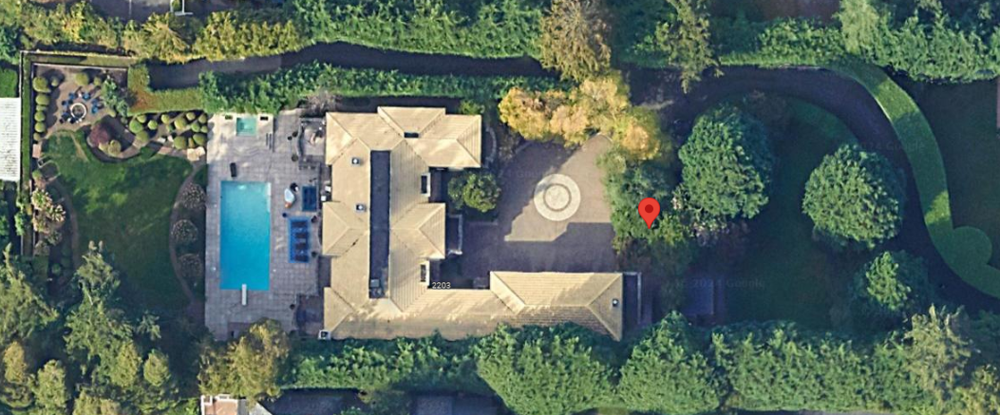
https://www.google.com/maps/place/47%C2%B037'49.8%22N+122%C2%B014'24.0%22W/@47.6305527,-122.241018,159m/data=!3m1!1e3!4m4!3m3!8m2!3d47.6305!4d-122.24?entry=ttu

House 4: 9410
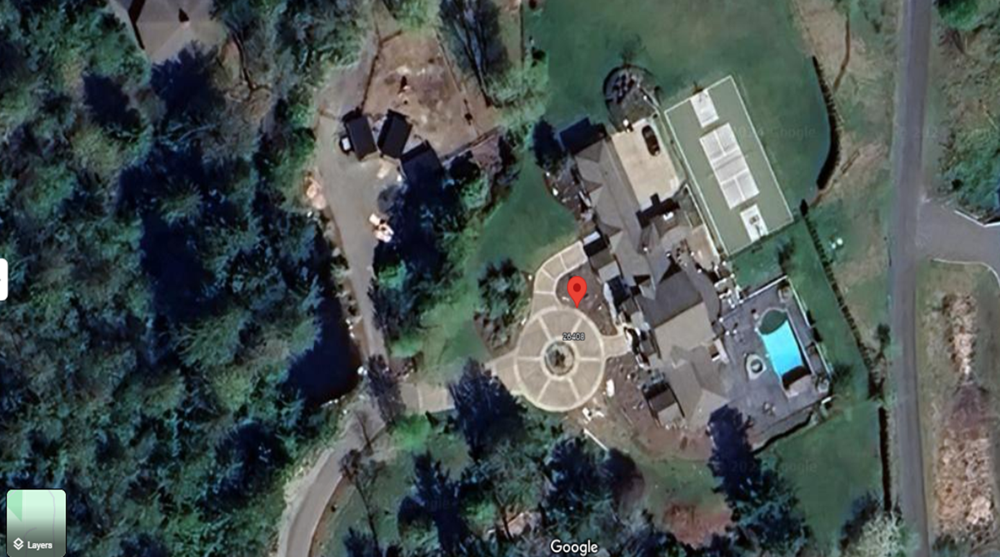

https://www.google.com/maps/place/47%C2%B040'03.0%22N+121%C2%B059'09.6%22W/@47.6675,-121.9885803,541m/data=!3m2!1e3!4b1!4m4!3m3!8m2!3d47.6675!4d-121.986?entry=ttu

# **Checking for duplicated values**

The dataset did not have any duplicates




In [25]:
#checks for duplicated values in the data
data.duplicated().sum()

0

## Checking for Kurtosis and skeweness

### variables
The histograms provide a visual distribution of the columns in the dataset. Most houses seem to have 3 bedrooms and around 2 bathrooms, aligning with common residential layouts. A majority of homes are two-stories, as indicated by the floors histogram. In terms of property grades, which reflect building construction and design quality, a concentration around the 7 to 8 mark suggests that many properties are well-made. The condition of homes varies less, with a significant number appearing to be in 'average' condition, as shown by the peak at the score of 3. This collection of graphs presents a quantified glimpse into the attributes of the properties listed, shedding light on common structural characteristics and amenities.

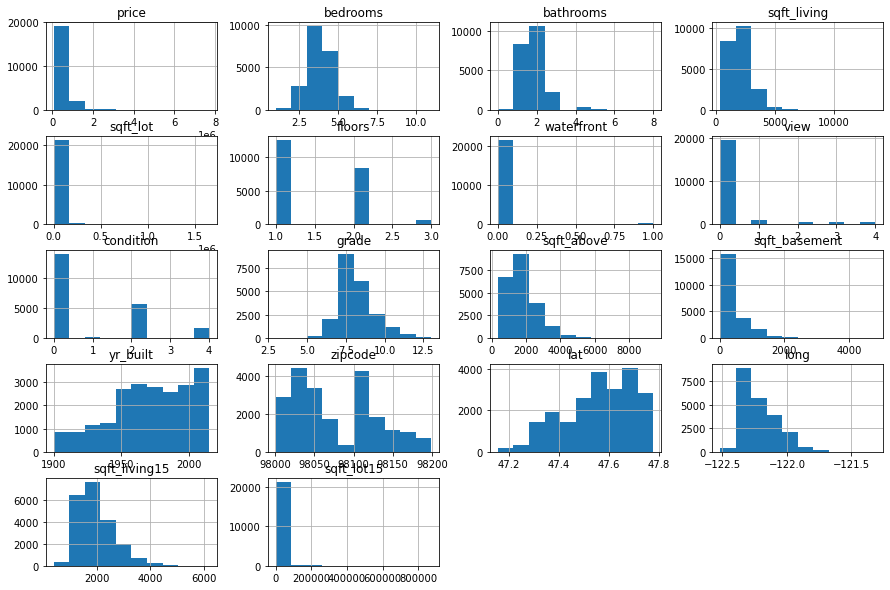

In [26]:
data.hist(figsize=(15,10));

In [27]:
from scipy import stats
for column in data.columns:
    if data[column].dtype in ['int64', 'float64'] and column not in ['lat',"id","yr_renovated", "zipcode" 'long']:
        # Calculate skewness including NaN values
        column_skew = stats.skew(data[column])
        column_kurtosis = stats.kurtosis(data[column])

        print(f"{column}: Skewness = {column_skew}, Kurtosis = {column_kurtosis}")


price: Skewness = 4.023049425360308, Kurtosis = 34.53180462212656
bedrooms: Skewness = 0.5513436042660719, Kurtosis = 1.796788393309975
sqft_living: Skewness = 1.4730409364724821, Kurtosis = 5.250278624437211
sqft_lot: Skewness = 13.071406775919803, Kurtosis = 285.4168446506654
sqft_above: Skewness = 1.4472910400607721, Kurtosis = 3.4043687408782395
sqft_basement: Skewness = 1.6052521720780755, Kurtosis = 2.8128614623644044
yr_built: Skewness = -0.46951650969824016, Kurtosis = -0.6577332213894365
zipcode: Skewness = 0.4053510982007504, Kurtosis = -0.8541078657467116
long: Skewness = 0.8847600028037259, Kurtosis = 1.051512389187967
sqft_living15: Skewness = 1.10675111840285, Kurtosis = 1.5910288678222386
sqft_lot15: Skewness = 9.523497853142834, Kurtosis = 151.3539158807631


The kurtosis values indicate the "tailedness" of the distribution for each property feature, which can be categorized as mesokurtic (similar to the normal distribution), leptokurtic (more peaked than the normal distribution), or platykurtic (less peaked than the normal distribution).

1. Price: With a kurtosis of 34.53, this feature is highly leptokurtic, indicating a distribution with a very sharp peak and fat tails, which suggests a large number of outliers significantly higher than the mean.
2. Bedrooms: A kurtosis of 49.81 is extremely leptokurtic, showing a very pointed distribution with fat tails, where properties with a large number of bedrooms are more common than what would be expected in a normal distribution.

3. Sqft_living: This feature, having a kurtosis of 5.25, is leptokurtic, meaning the distribution is more peaked with heavier tails compared to a normal distribution, suggesting the presence of outliers with larger living areas.

4. Sqft_lot: Exhibits a very high kurtosis of 285.43, indicating an extremely leptokurtic distribution, with a high frequency of outliers with very large lot sizes that are distant from the average.

5. Condition: Shows a kurtosis close to 0 (0.52), which is mesokurtic and resembles the normal distribution in terms of peak and tails, indicating fewer outliers.

6. Grade: With a kurtosis of 1.13, this feature is slightly leptokurtic but close to mesokurtic, showing a slightly more pronounced peak and tails than a normal distribution.

7. Sqft_above: A kurtosis of 3.40 suggests a leptokurtic distribution, with a sharper peak and thicker tails than a normal distribution, indicating some outliers in above-ground living space.

8. Sqft_basement: A kurtosis of 2.81 also indicates a leptokurtic distribution, with a higher peak and fatter tails, meaning there are properties with significantly large basements compared to the average.

9. Sqft_living15: With a kurtosis of 1.59, this is leptokurtic, indicating a distribution that has a moderate peak and somewhat heavy tails, suggesting the size of neighboring living spaces has more extreme values than would be expected in a normal distribution.

10. Sqft_lot15: Exhibits a very high kurtosis of 151.36, marking it as leptokurtic with a highly peaked distribution and very heavy tails, showing a significant number of properties with larger-than-average neighboring lot sizes.

# Correlation
In this part we explore various factors to understand their relationship with the price of houses. Two crucial concepts in this analysis are multicollinearity and correlation.  Variables such as sqft_living, bedrooms, bathrooms, and sqft_above exhibit strong correlations with each other, indicating potential multicollinearity. This can be problematic because it undermines the statistical significance of an independent variable. For instance, bedrooms and bathrooms are highly correlated (0.901800), and both are also strongly correlated with sqft_living, suggesting they may not independently influence the price as much as their combined effect might.

On the correlation between price and other variables, our analysis shows significant positive correlations between price and features such as sqft_living (0.701917), grade (0.667951), and sqft_above (0.605368), among others. These correlations suggest that as the size, quality, and living area of a house increase, so does its price. However, variables that are likely to yield multicollinearity, such as bedrooms_bathrooms (a product of bedrooms and bathrooms, showing a correlation of 0.901800 with bathrooms), could inflate the variance of the coefficient estimates and make the model less reliable. 

<AxesSubplot:>

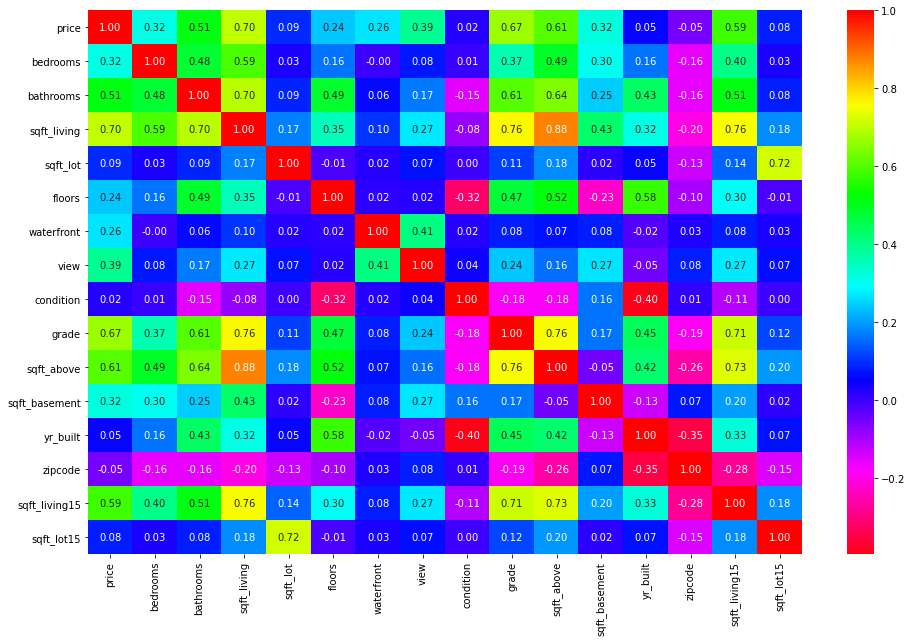

In [28]:
# Create the heatmap using seaborn
# Select the desired columns for the correlation matrix
selected_columns = data[['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'zipcode',
       'sqft_living15', 'sqft_lot15']]

# Calculate the correlation matrix for the selected columns
corr_matrix = selected_columns.corr()

# Set the figure size for the heatmap
plt.figure(figsize=(16, 10))

# Create the heatmap with annotations, a specific format, and a color map
sns.heatmap(corr_matrix,fmt=".2f", cmap='hsv_r', annot=True )

We examined the correlation between 'price' and various housing features in a dataset. The 'sqft_living' shows the highest correlation with 'price', suggesting the size of the living area is a strong predictor of price. Features like 'grade' and the square footage of the area above the basement ('sqft_above') also show significant positive correlations, indicating that the overall quality and living space contribute to the pricing of a house. The least correlated features include geographic coordinates (latitude and longitude), suggesting that location by coordinates alone isn't as strongly tied to price in this dataset.

In [29]:
# Let's look at the correlations with 'price'
# (our dependent variable) in particular.

price_corrs = data.corr()['price'].map(abs).sort_values(ascending=False)
price_corrs 

price            1.000000
sqft_living      0.701929
grade            0.667964
sqft_above       0.605392
sqft_living15    0.585267
bathrooms        0.510657
view             0.394713
sqft_basement    0.321103
bedrooms         0.315961
lat              0.306687
waterfront       0.264308
floors           0.237279
sqft_lot         0.089879
sqft_lot15       0.082849
yr_built         0.053965
zipcode          0.053409
condition        0.022218
long             0.022047
Name: price, dtype: float64

### Correlation graphs
Based on the graphs below there is a positive correlation indicating that house sale price icreases with increase in square footage of above ground level, below ground level and total interior living space of the house.

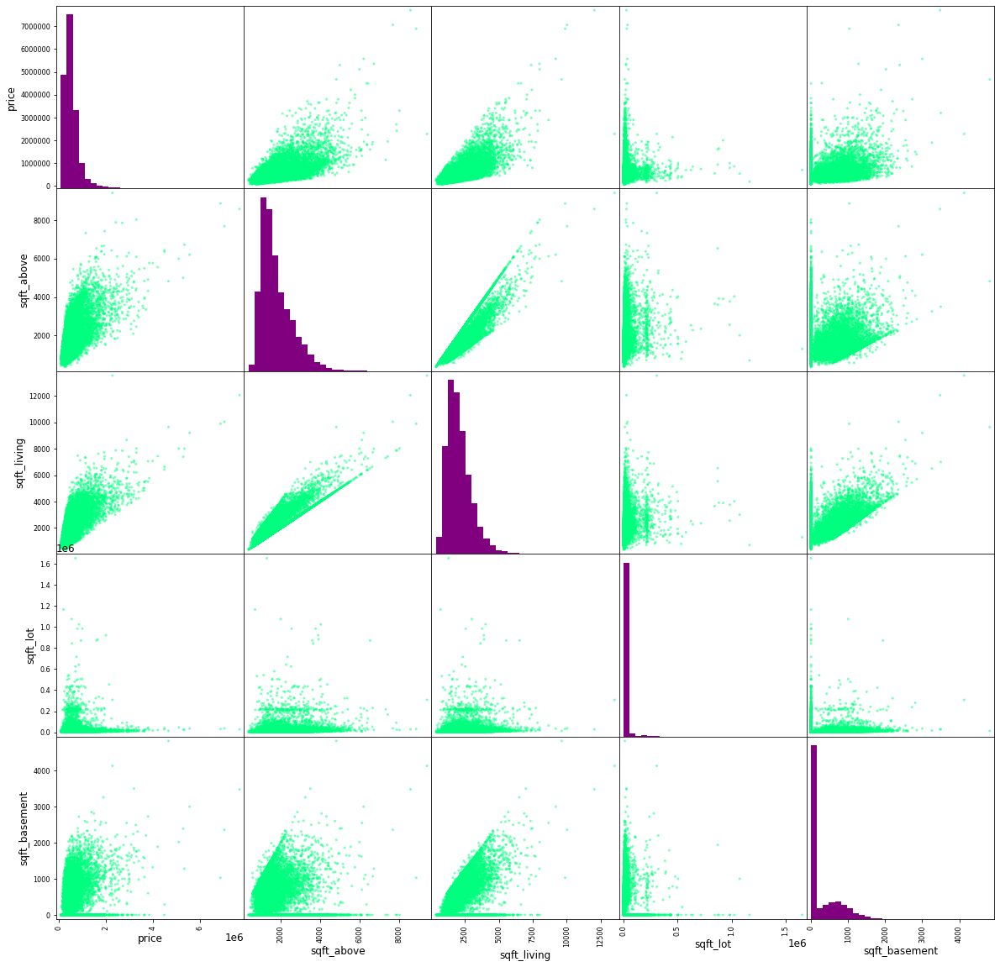

In [30]:
plt.rc('font', size=12)
scatter_matrix(data[['price','sqft_above', 'sqft_living','sqft_lot', 'sqft_basement']], 
               figsize=(20, 20), diagonal='hist', hist_kwds={'bins':30, 'color': 'purple'}, color = 'springgreen')
plt.tight_layout;
plt.show()

## Splitting the Data into Training and Testing Sets
The first basic step for regression is performing a train-test split. 

In [31]:
# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
data_train, data_test = train_test_split(data, train_size = 0.7, test_size = 0.3, random_state = 500)

In [32]:
data_train.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
8386,12/31/2014,582000.0,3,1,1820,3140,2,0,0,4,8,1820,0.0,1949,98136,47.5271,-122.384,2030,5499
1317,8/19/2014,600000.0,3,1,1620,1325,2,0,0,0,9,1430,190.0,2005,98102,47.6498,-122.321,1750,1572
6170,1/7/2015,354000.0,3,1,1340,6300,1,0,0,0,7,1340,0.0,1972,98034,47.7186,-122.218,1780,7200
971,2/2/2015,397500.0,3,1,1510,13737,1,0,3,2,6,810,700.0,1961,98125,47.7289,-122.283,2560,10202
6122,9/11/2014,775000.0,3,2,2620,241200,1,0,0,2,9,2620,0.0,1998,98027,47.4574,-122.010,2620,172933


In [33]:
data_train.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
8386,12/31/2014,582000.0,3,1,1820,3140,2,0,0,4,8,1820,0.0,1949,98136,47.5271,-122.384,2030,5499
1317,8/19/2014,600000.0,3,1,1620,1325,2,0,0,0,9,1430,190.0,2005,98102,47.6498,-122.321,1750,1572
6170,1/7/2015,354000.0,3,1,1340,6300,1,0,0,0,7,1340,0.0,1972,98034,47.7186,-122.218,1780,7200
971,2/2/2015,397500.0,3,1,1510,13737,1,0,3,2,6,810,700.0,1961,98125,47.7289,-122.283,2560,10202
6122,9/11/2014,775000.0,3,2,2620,241200,1,0,0,2,9,2620,0.0,1998,98027,47.4574,-122.010,2620,172933


# Preparing data for modeling
We prepared the data for modeling from a real estate dataset. We made a deep copy of the original data to ensure any changes don't affect the original dataset. We identified the 'price' as our target variable, which is what we aim to predict. To prevent data leakage and ensure the model is accurate and reliable, we excluded 'price' from the predictors, along with 'date', 'lat', 'long', 'zipcode', and 'sqft_lot15'. The first few entries in the target variable show a range of prices, indicating diversity in housing values. The predictors include various house features, such as the number of bedrooms and bathrooms, square footage of living space, and the grade of the house, providing a comprehensive set of variables to inform our prediction model.

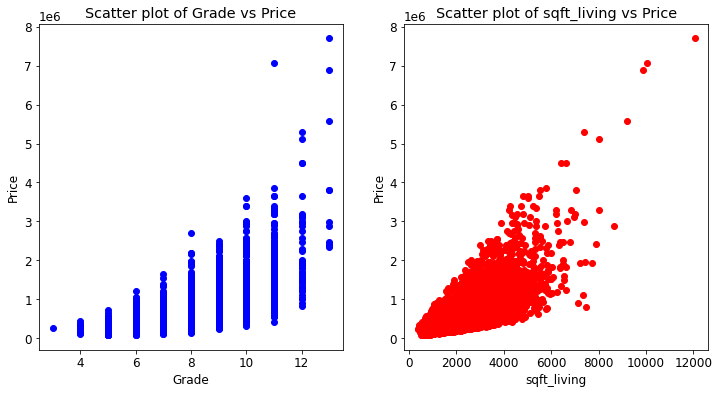

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plotting the first scatter plot on ax1
ax1.scatter(data_train.grade, data_train.price, color='blue')
ax1.set_title("Scatter plot of Grade vs Price")
ax1.set_xlabel('Grade')
ax1.set_ylabel('Price');

# Plotting the second scatter plot on ax2
ax2.scatter(data_train.sqft_living, data_train.price, color='red')
ax2.set_title("Scatter plot of sqft_living vs Price")
ax2.set_xlabel('sqft_living')
ax2.set_ylabel('Price');


Although sqft_living has the highest correalation with price our target variable we will not use it in our baseline model since it exhibits multicollinearity with other varibles. Let's use grade since it has the second highest correlation with price.

## Baseline Model
The price and grade of living space were chosen to establish the baseline model. This choice was motivated by the strong correlation between these two variables, measured at 0.668. Additionally, grade demonstrated lower collinearity with other predictors, thereby reducing concerns of multicollinearity. We transformed the target variable(price) so that it approaches a normal distribution.

In [35]:
X_baseline= data_train['grade']# predictors  # data leakage
y =np.log(data_train["price"])
model=sm.OLS(y, sm.add_constant(X_baseline)).fit()
result=model.summary()
print(result)

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.493
Method:                 Least Squares   F-statistic:                 1.467e+04
Date:                Sun, 07 Apr 2024   Prob (F-statistic):               0.00
Time:                        16:13:03   Log-Likelihood:                -6632.0
No. Observations:               15117   AIC:                         1.327e+04
Df Residuals:                   15115   BIC:                         1.328e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.6410      0.020    529.381      0.0

Our  baseline model is statistically significant overall since the f statistic pvalue is very low, and explains about 49.3% of the variance in Price of the house. 

The model's coefficients is  statistically significant, with t-statistic p-values well below 0.05.For each increase in 1 in the grade there is a corresponding increase in the price of the house by $0.3144.

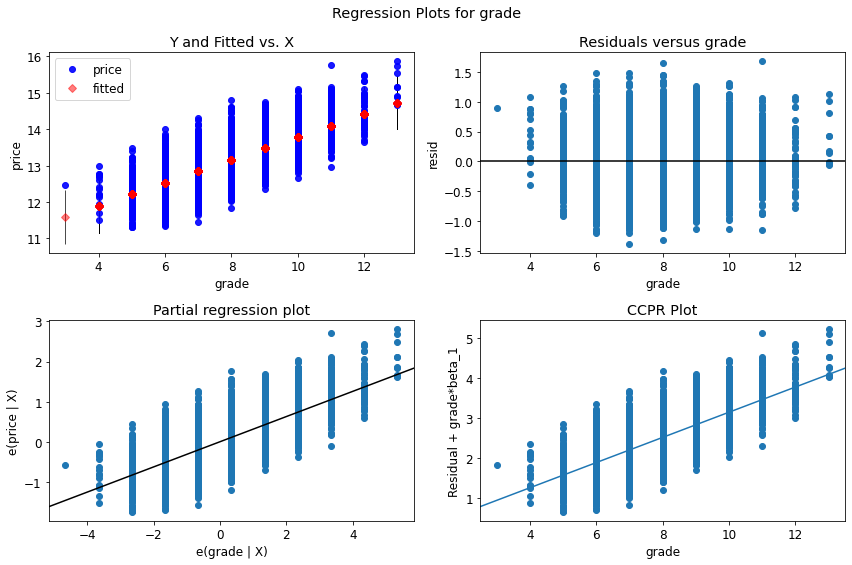

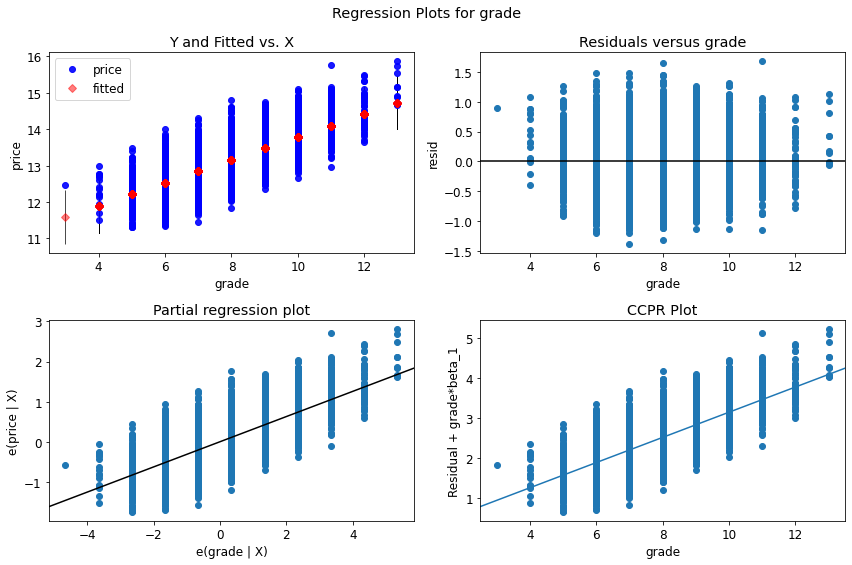

In [36]:
#checking residual in model0
sm.graphics.plot_regress_exog(model, "grade", fig=plt.figure(figsize=(12,8)))

## Multiple Linear Regression 
Adding more predictors to our baseline  model can enhance its predictive power by capturing additional complexity and potential relationships within our data. This can lead to improved model accuracy and potentially reducing bias by considering more factors in the prediction process.

In [37]:
data_train.columns 

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'zipcode', 'lat', 'long', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [38]:
#To determine the predictor and the target variable
# 
X= data_train[['waterfront', 'view', 'grade','floors', 'yr_built', 'bedrooms', 'bathrooms', 'sqft_living15']] # predictors  # data leakage
# 'price','condition', 'sqft_living15', 'grade', 'sqft_living','sqft_above','floors', 'sqft_lot', 'yr_built','long', 'zipco
model1=sm.OLS(y, sm.add_constant(X))
result1=model1.fit() 
print(result1.summary()) 


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.629
Model:                            OLS   Adj. R-squared:                  0.629
Method:                 Least Squares   F-statistic:                     3205.
Date:                Sun, 07 Apr 2024   Prob (F-statistic):               0.00
Time:                        16:13:09   Log-Likelihood:                -4260.7
No. Observations:               15117   AIC:                             8539.
Df Residuals:                   15108   BIC:                             8608.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            22.7637      0.220    103.408

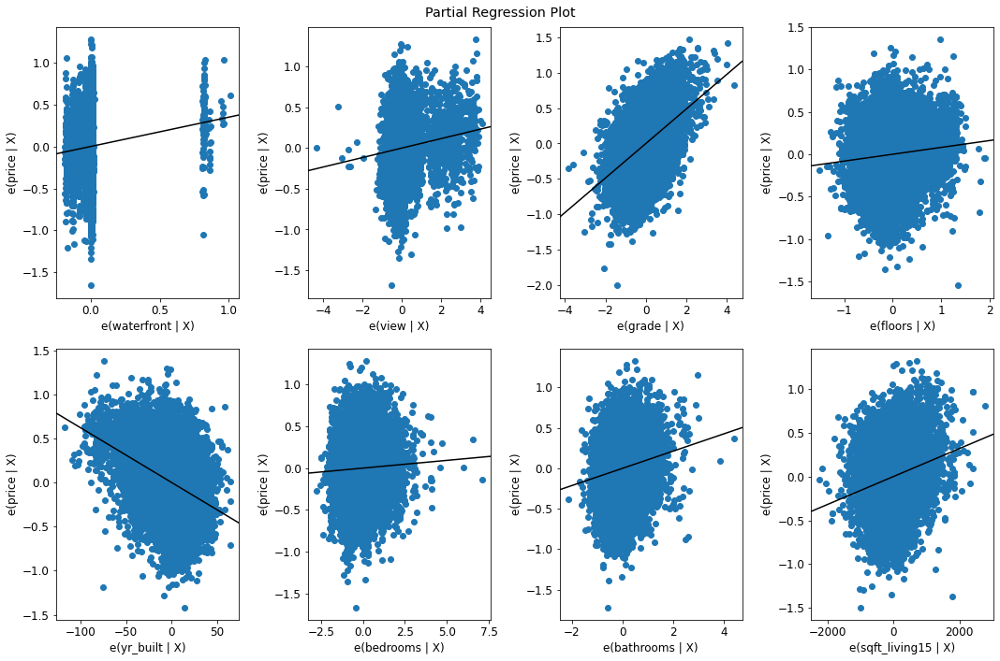

In [39]:
fig=plt.figure(figsize=(15,10))
sm.graphics.plot_partregress_grid(
    result1,
    exog_idx=list(X.columns.values),
    grid=(2,4),
    fig=fig)
plt.show()

Our model is statistically significant overall since the f statistic pvalue is very low, and explains about 62.9% of the variance in Price of the house. The variance in price has increased compared to the baseline model indicating that this is a better model.

All model coefficients  are statistically significant, with t-statistic p-values well below 0.05

For a house with a value of 0 (grade, bedrooms, sqft_living15, bathrooms, floors, yr_built, view, waterfront),we would sell the house at a price of about $22.

For each increase of 1  in sqft_living15, we see an associated increase in Price of about $0.002.

For each increase of 1  in bathrooms, we see an associated increase in Price of about $0.1067.

For each increase of 1  in no.of bedrooms, we see an associated increase in Price of about $0.0185.

For each increase of 1  in yr_built, we see an associated decrease in Price of about $0.0062.

For each increase of 1  in grade of the house, we see an associated increase in Price of about $0.2430.

For each increase of 1  in view, we see an associated increase in Price of about $0.0582.

For each increase of 1 in waterfront, we see an associated increase in Price of about $0.3476.

In this section we center our data so that we can improve the interpretation of the model.

In [40]:
X_centered = X.copy() 
for col in X_centered.columns:
    X_centered[col] = X_centered[col] - X_centered[col].mean() 
model4 = sm.OLS(y, sm.add_constant(X_centered))
result4=model4.fit()
print(result4.summary())    

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.629
Model:                            OLS   Adj. R-squared:                  0.629
Method:                 Least Squares   F-statistic:                     3205.
Date:                Sun, 07 Apr 2024   Prob (F-statistic):               0.00
Time:                        16:13:12   Log-Likelihood:                -4260.7
No. Observations:               15117   AIC:                             8539.
Df Residuals:                   15108   BIC:                             8608.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            13.0475      0.003   4999.897

 For a house with average (grade, bedrooms, sqft_living15, bathrooms, floors, yr_built, view, waterfront),we would the house saleprice to be of about $13.

For an average increase  in sqft_living15, we see an associated increase in Price of about $0.002.

For  an average increase  in bathrooms, we see an associated increase in Price of about $0.1067.

For  an average increase in no.of bedrooms, we see an associated increase in Price of about $0.0185.

For  an average increase in yr_built, we see an associated decrease in Price of about $0.0062.

For an average increase  in grade of the house, we see an associated increase in Price of about $0.2430.

For an average increase  in view, we see an associated increase in Price of about $0.0582.

For  an average increase in waterfront, we see an associated increase in Price of about $0.3476.

## Polynomial Regression  and Model Metrics
The independent variable(s) and the dependent variable is modeled as an nth-degree polynomial. It extends linear regression by allowing the relationship between variables to be modeled as a curve rather than a straight line. In thic case we use  it to determine whether its a better fit compared to the multiple linear regression

In [41]:
poly= PolynomialFeatures(degree=2, include_bias=False)
poly_features = poly.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=10)
# Let's fit our model
poly_reg_model = LinearRegression()
poly_reg_model.fit(X_train, y_train)
# Let's train our model
poly_reg_y_predicted1 = poly_reg_model.predict(X_test)
from sklearn.metrics import mean_squared_error
poly_reg_rmse = np.sqrt(mean_squared_error(y_test, poly_reg_y_predicted1))
print("Polynomial RMSE: ",poly_reg_rmse) 
r_squared = r2_score(y_test, poly_reg_y_predicted1)
print("R_squared: ", r_squared)

Polynomial RMSE:  0.30945551850737973
R_squared:  0.648583990298395


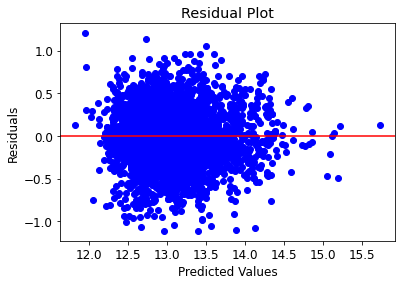

In [42]:
residuals = y_test - poly_reg_y_predicted1

# Plotting the residuals
plt.scatter(poly_reg_y_predicted1, residuals, color='blue')
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')  # Adding a horizontal line at y=0
plt.show()

Judging from the values obtained, it is evident that Polynomial regression is a better model in this case, since It explains approximately 63% of variance in house prices  which is slighlty higher than the variance explained using the multiple linear regression . The Root Squared Mean Error for polynomial regression is also lower than that of the linear model.This implies that the polynomial regression performed better.

In [43]:
# Linear Regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)
lin_reg_model = LinearRegression()
lin_reg_model.fit(X_train, y_train)
lin_reg_y_predicted = lin_reg_model.predict(X_test)
lin_reg_rmse = np.sqrt(mean_squared_error(y_test, lin_reg_y_predicted))
print('Linear Regression RMSE:',lin_reg_rmse)


Linear Regression RMSE: 0.31880291134248084


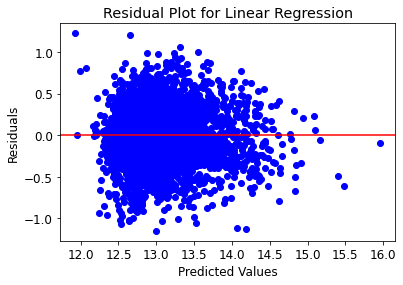

In [44]:
# Calculating residuals
residuals = y_test - lin_reg_y_predicted

# Plotting the residuals
plt.scatter(lin_reg_y_predicted, residuals, color='blue')
plt.title('Residual Plot for Linear Regression')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')  # Adding a horizontal line at y=0
plt.show()

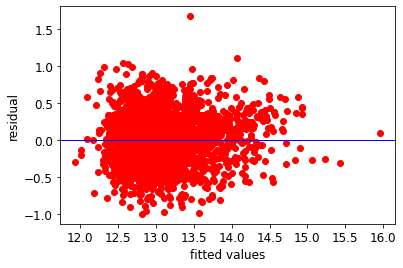

In [45]:
#Regrssion Model
X_train, X_test, admit_train, admit_test = train_test_split(X, y, test_size=0.2, random_state=0)
regressor = LinearRegression()
regressor.fit(X_train, admit_train)
# This is our prediction our model
y_predict = regressor.predict(X_test)
#
residuals = np.subtract(y_predict, admit_test)
# Plot
plt.scatter(y_predict, residuals, color='red')
plt.ylabel('residual')
plt.xlabel('fitted values')
plt.axhline(y= residuals.mean(), color='blue', linewidth=1)
plt.show() 

# Z_Statistics
In this section we are interested in determining whether houses with a waterfront view are priced significantly higher than those without. To do this, we will conduct a z-test, a statistical method suited for comparing the means of two independent samples when sample sizes are large and population variances are known.
### Do houses with a waterfront view have a significantly higher average price compared to houses without a view?

Ho: Houses with waterfront view do not have significantly higher prices when compared oto houses without front view.

H1: Houses with waterfront view have significantly higher prices when compared oto houses without front view.

In [46]:

# Extract prices for each group
prices_with_view = data[data['waterfront'] == 1]['price']
prices_no_view = data[data['waterfront'] == 0]['price']

# Perform Z-test for independent samples
z_statistic, p_value = ztest(prices_with_view, prices_no_view, alternative='larger') # 'larger' indicates a one-tailed test

# Set significance level (alpha)
alpha = 0.05

# Print results
print(f"Z-statistic: {z_statistic:.2f}")
print(f"P-value: {p_value:.4f}")

# Interpret results
if p_value < alpha:
    print(f"We reject the null hypothesis at {(1 - alpha) * 100}% confidence level and conclude that houses with a waterfront view have a significantly higher average price.")
else:
    print(f"Fail to reject the null hypothesis {(1 - alpha) * 100}% confidence level and conclude that there is not enough evidence to conclude that the average price for houses with a waterfront view is significantly higher.")

Z-statistic: 40.27
P-value: 0.0000
We reject the null hypothesis at 95.0% confidence level and conclude that houses with a waterfront view have a significantly higher average price.


In [47]:
data.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'zipcode', 'lat', 'long', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

# Chi Square
In this section we aim to explore whether the average lot size (measured in square footage, sqft_lot) of houses varies significantly across different grades. 
### Is there a statistically significant difference in lot size (sqft_lot) among houses with varying grades?
Ho: There is no significant relationship between the condition of a house and its grade.

H1:There is a significant relationship between the condition of a house and its grade.



In [48]:
data['condition'] = pd.Categorical(data['condition'])
data['grade'] = pd.Categorical(data['grade'])

# Create a contingency table
contingency_table = pd.crosstab(data['condition'], data['grade'])

# Perform the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the results
print(f"Chi-Square Value = {chi2}")
print(f"P-value = {p}")
print(f"Degrees of Freedom = {dof}")
print("Expected counts:")
print(expected)

# Interpret the results
if p < 0.05:
    print("There is a significant relationship between the condition of a house and its grade.")
else:
    print("There is no significant relationship between the condition of a house and its grade.")

Chi-Square Value = 1456.5331050844095
P-value = 1.0659619604967735e-279
Degrees of Freedom = 40
Expected counts:
[[6.49194295e-01 1.75282460e+01 1.57105019e+02 1.32305797e+03
  5.82522041e+03 3.93736340e+03 1.69764308e+03 7.36186331e+02
  2.59028524e+02 5.77782923e+01 8.43952584e+00]
 [7.87182812e-03 2.12539359e-01 1.90498240e+00 1.60427857e+01
  7.06339137e+01 4.77426375e+01 2.05848305e+01 8.92665308e+00
  3.14085942e+00 7.00592702e-01 1.02333766e-01]
 [2.62872754e-01 7.09756436e+00 6.36152065e+01 5.35734673e+02
  2.35875722e+03 1.59432325e+03 6.87412252e+02 2.98097703e+02
  1.04886229e+02 2.33956751e+01 3.41734580e+00]
 [1.34284127e-03 3.62567142e-02 3.24967587e-01 2.73671050e+00
  1.20493147e+01 8.14433228e+00 3.51152991e+00 1.52278200e+00
  5.35793665e-01 1.19512873e-01 1.74569365e-02]
 [7.87182812e-02 2.12539359e+00 1.90498240e+01 1.60427857e+02
  7.06339137e+02 4.77426375e+02 2.05848305e+02 8.92665308e+01
  3.14085942e+01 7.00592702e+00 1.02333766e+00]]
There is a significant rel

# ANOVA Test: Price vs. Interaction of Bedrooms and Bathrooms
## To what extent does the combined influence of bedrooms and bathrooms affect the price of a house?


Multiplying these two features (data['bedrooms'] * data['bathrooms']) allowed us to explore whether the combination of bedrooms and bathrooms has a synergistic effect on the house price that is different from the sum of their individual effects. For example, a house with more bedrooms might be more valuable only if it also has a sufficient number of bathrooms to serve those bedrooms.

H0: There is no statistically significant interaction effect between the number of bedrooms and the number of bathrooms on the price of a house. 

H1: There is a statistically significant interaction effect between the number of bedrooms and the number of bathrooms on the house price. 



In [49]:

# Create the interaction term
data['bedrooms_bathrooms'] = data['bedrooms'] * data['bathrooms']

# Define the formula for the model
formula = 'price ~ bedrooms + bathrooms + bedrooms_bathrooms'

# Create the linear regression model
model = ols(formula, data=data).fit()


# Perform ANOVA to test for interaction effect and the effect of floors
anova_table = sm.stats.anova_lm(model, typ=3)

# Define significance level
alpha = 0.05

# Extract the results for the interaction term 'bedrooms_bathrooms'
interaction_results = anova_table.loc['bedrooms_bathrooms']

# Determine if we reject the null hypothesis for the interaction effect
if interaction_results['PR(>F)'] < alpha:
    interpretation = ("We reject the null hypothesis at 95 percent confident level and conclude that there is a statistically significant interaction effect between "
                      "the number of bedrooms and the number of bathrooms on the house price.")
else:
    interpretation = ("We fail to reject the null hypothesis at 95 percent confident level and conclude that there is no statistically significant interaction effect between "
                      "the number of bedrooms and the number of bathrooms on the house price.")

# Print the decision and interpretation for the interaction effect
print (interpretation)

We reject the null hypothesis at 95 percent confident level and conclude that there is a statistically significant interaction effect between the number of bedrooms and the number of bathrooms on the house price.


# Limitation of the study 

## Limitations
The dataset focuses exclusively on the Northeastern region, limiting its applicability for nationwide housing price predictions. This geographical concentration suggests that findings derived from this data may not be representative of broader national trends. 

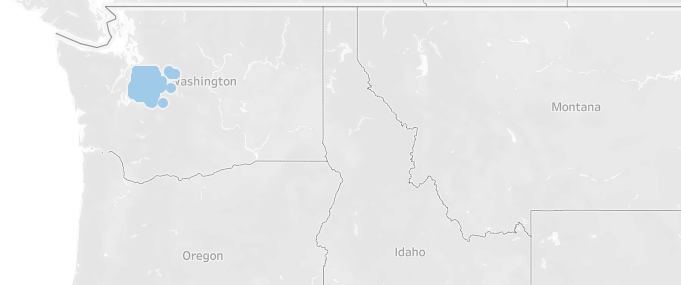

Additionally, the dataset exhibited a significant degree of multicollinearity among the variables analyzed, underscoring a potential risk for biased or inflated prediction outcomes. 

## Recommendations
• The shareholder should encourage homeowners to do renovations so as to improve the overall condition and raise the property's grade as this has a great impact on the value of a house.

• There is also high impact of square footage of living space on house prices and use this information to justify higher listing prices for properties with more extensive square footage.

• The number of bathrooms and bedrooms also have a positive correlation with the value of a house. Therefore, during renovation adding a bedroom would increase the value of the house! 

• For price prediction of the houses, we recommend use of Polynomial regression model as it gives a high R- squared value which means that we can get a better and more accurate price value.

• Comprehensive Value Drivers: Property value extends beyond the physical space, being significantly influenced by structural integrity, prime location, and year of construction market.

• Quality and Lot Size Connection: A property's condition directly correlates with its lot size, highlighting the importance of upkeep and modernization in enhancing market value.

• Premium on Waterfront Views: Properties boasting waterfront views command higher market prices, representing a lucrative investment for buyers and a unique selling proposition for owners.

• Optimal Bedrooms and Bathrooms Mix: The combination of bedrooms and bathrooms significantly impacts house pricing, guiding strategic property selection for buyers and effective marketing for sellers.

## Conclusion

The study into the dynamics of housing price determinants underscores the complexity and multifaceted nature of real estate markets. The study reveals that a deep and nuanced understanding of regional trends, economic indicators, and a plethora of other variables is essential for crafting accurate and reliable predictive models. The insights gained from this research highlight the importance of adopting comprehensive and sophisticated analytical frameworks that can accommodate the intricate interplay of factors affecting housing prices.

Moreover, the findings underscore the value of continuous refinement and expansion of data collection methodologies, emphasizing the need for high-quality, diverse datasets. Such datasets are crucial for developing models that are not only robust and predictive but also reflective of the real-world variability and diversity of housing markets across different regions.

This research, therefore, not only contributes to the academic discourse on housing price prediction but also provides practical insights for policymakers, urban planners, and investors. By fostering a deeper understanding of market dynamics and improving predictive methodologies, we can better navigate the complexities of the housing market, ultimately contributing to more sustainable and equitable urban development.